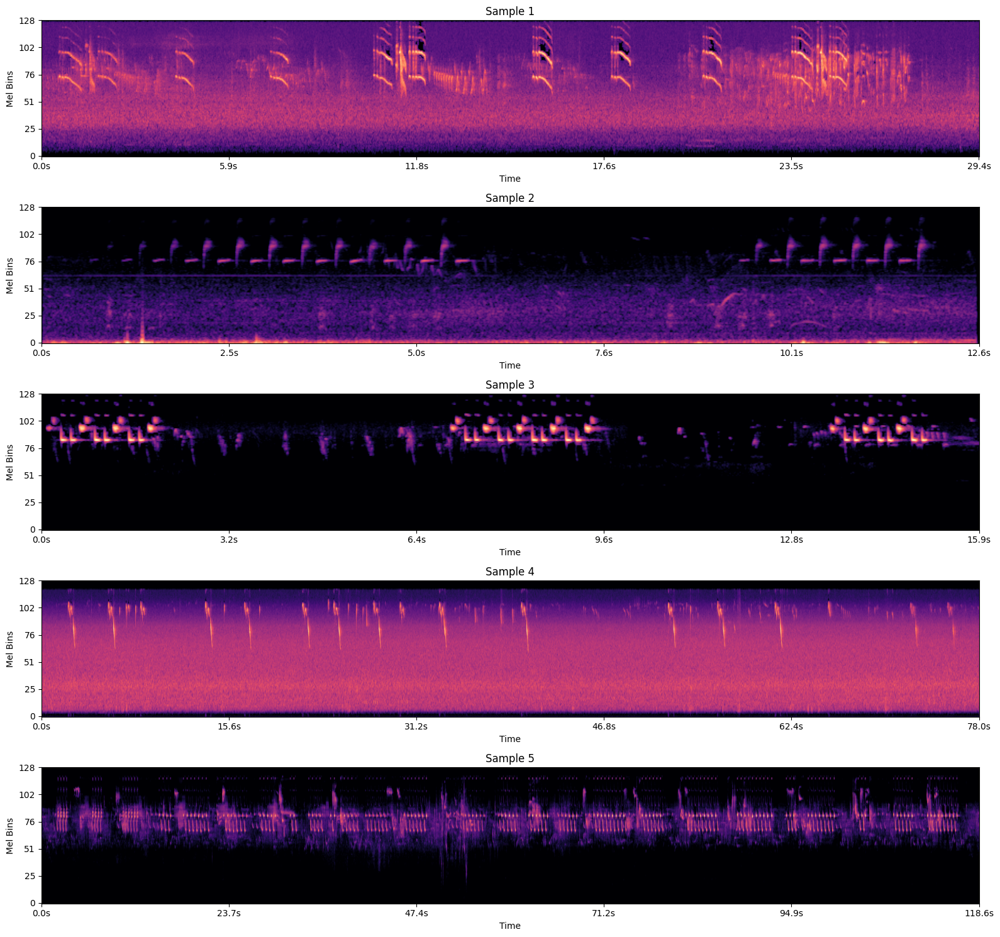

In [105]:
from datasets import Audio, load_dataset
import numpy as np
import matplotlib.pyplot as plt
import librosa

ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=32_000))  # ensures decoding

test = ds["train"]

audio_arrays = []
sampling_rates = []

# Collect 5 audio samples and plot their spectrograms in a collage
num_samples = 5

for ex in test.take(num_samples):
    wav = ex["audio"]["array"]  # np.float32 samples
    sr = ex["audio"]["sampling_rate"]  # should be 32000
    audio_arrays.append(wav)
    sampling_rates.append(sr)

# Make sure all sampling rates match
assert len(set(sampling_rates)) == 1, "Sampling rates differ between examples!"
sample_rate = sampling_rates[0]

# Prepare helpful axis bars for time and mel frequencies
hop_length = 64
n_mels = 128

def plot_scale_bars(ax, S_shape, sample_rate, hop_length, n_mels, length_px=40, height_px=5, color='white'):
    time_steps, mel_bins = S_shape[1], S_shape[0]

    # Bar for time axis: draw at lower right
    bar_length_time_sec = 0.5  # show bar for 0.5 seconds
    time_per_pixel = hop_length / sample_rate
    bar_pixels_time = int(bar_length_time_sec / time_per_pixel)
    # Don't exceed the axis dimensions
    bar_pixels_time = min(bar_pixels_time, time_steps // 2)
    # Bar for mel axis: draw at lower right, up offset 10 bins
    mel_bar_bins = 10  # we'll show a 10-bin bar
    
    # Draw time bar (horizontal)
    ax.plot(
        [time_steps - bar_pixels_time - 4, time_steps - 4], [4, 4],
        lw=height_px, color=color, solid_capstyle='butt'
    )
    ax.text(
        time_steps - bar_pixels_time // 2 - 4, 10,
        f"{bar_length_time_sec:.1f}s", color=color,
        ha='center', va='bottom', fontsize=10, fontweight='bold'
    )
    # Draw mel bar (vertical)
    ax.plot(
        [time_steps - 4, time_steps - 4],
        [4, 4 + mel_bar_bins], lw=height_px, color=color, solid_capstyle='butt'
    )
    ax.text(
        time_steps - 6, 4 + mel_bar_bins / 2,
        f"{mel_bar_bins} mel", color=color,
        ha='right', va='center', fontsize=10, fontweight='bold', rotation=90
    )

# Create a collage of spectrograms for each sample before concatenation
n_rows = num_samples
n_cols = 1
fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 3*n_rows))

for idx, audio in enumerate(audio_arrays):
    S = librosa.feature.melspectrogram(y=audio, sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_dB = librosa.power_to_db(S, ref=np.max)
    if n_rows == 1:
        ax = axs
    else:
        ax = axs[idx]
    img = ax.imshow(S_dB, origin='lower', aspect='auto', cmap='magma')
    ax.set_title(f'Sample {idx + 1}')
    
    # Add time and mel scale bars for the whole x and y axis
    time_duration = len(audio) / sample_rate
    time_ticks = np.linspace(0, S_dB.shape[1], 6)
    time_labels = [f"{t:.1f}s" for t in np.linspace(0, time_duration, 6)]
    ax.set_xticks(time_ticks)
    ax.set_xticklabels(time_labels)
    ax.set_xlabel('Time')
    
    mel_ticks = np.linspace(0, n_mels, 6)
    mel_labels = [f"{int(m)}" for m in mel_ticks]
    ax.set_yticks(mel_ticks)
    ax.set_yticklabels(mel_labels)
    ax.set_ylabel('Mel Bins')

plt.tight_layout()
plt.show()


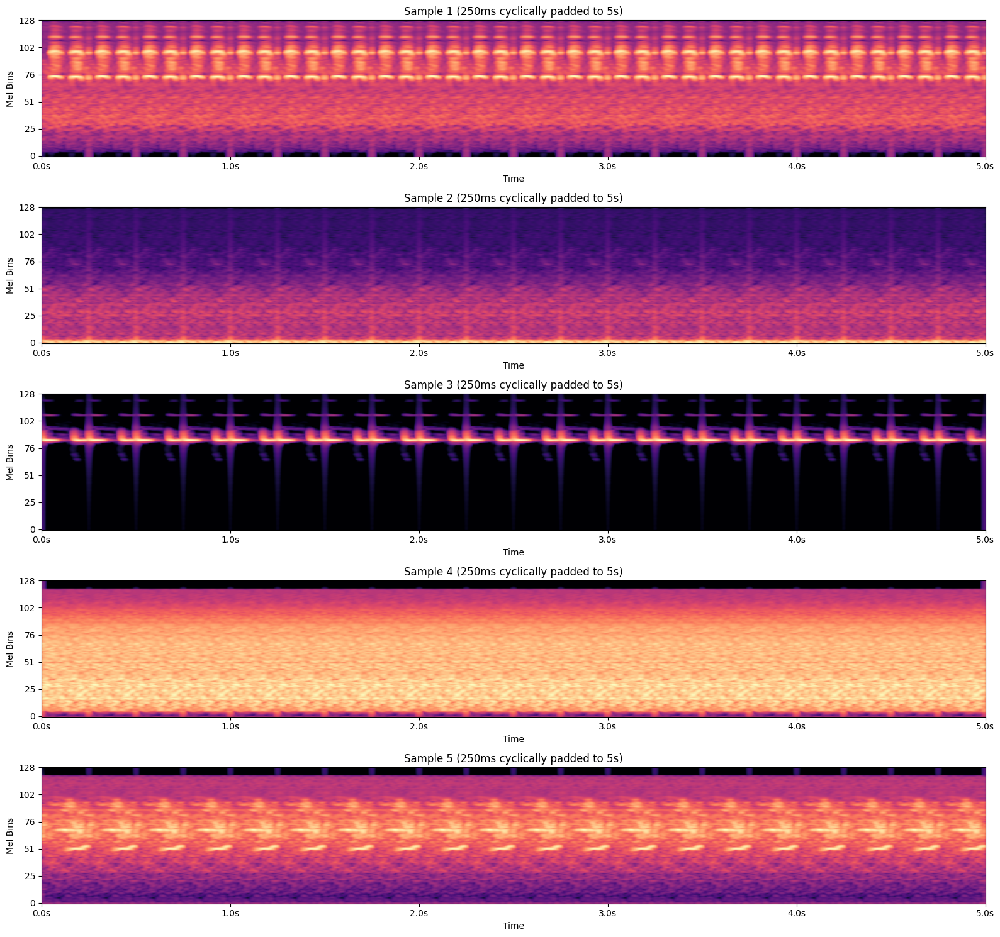

In [107]:
from datasets import Audio, load_dataset
import numpy as np
import matplotlib.pyplot as plt
import librosa

ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=32_000))  # ensures decoding

test = ds["train"]

audio_arrays = []
sampling_rates = []

# Collect 5 audio samples and extract random 250ms segments with cyclic padding
num_samples = 5
segment_duration = 0.250  # 250ms
target_duration = 5.0   # 5 seconds

for ex in test.take(num_samples):
    wav = ex["audio"]["array"]  # np.float32 samples
    sr = ex["audio"]["sampling_rate"]  # should be 32000
    
    # Calculate number of samples for segment and target
    segment_samples = int(segment_duration * sr)
    target_samples = int(target_duration * sr)
    
    # Extract random 250ms segment
    if len(wav) > segment_samples:
        start_idx = np.random.randint(0, len(wav) - segment_samples)
        segment = wav[start_idx:start_idx + segment_samples]
    else:
        # If audio is shorter than 250ms, use the whole thing
        segment = wav
    
    # Cyclically pad to 5 seconds
    if len(segment) < target_samples:
        num_repeats = int(np.ceil(target_samples / len(segment)))
        padded = np.tile(segment, num_repeats)[:target_samples]
    else:
        padded = segment[:target_samples]
    
    audio_arrays.append(padded)
    sampling_rates.append(sr)

# Make sure all sampling rates match
assert len(set(sampling_rates)) == 1, "Sampling rates differ between examples!"
sample_rate = sampling_rates[0]

# Prepare helpful axis bars for time and mel frequencies
hop_length = 64
n_mels = 128

# Create a collage of spectrograms for each sample
n_rows = num_samples
n_cols = 1
fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 3*n_rows))

for idx, audio in enumerate(audio_arrays):
    S = librosa.feature.melspectrogram(y=audio, sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_dB = librosa.power_to_db(S, ref=np.max)
    if n_rows == 1:
        ax = axs
    else:
        ax = axs[idx]
    img = ax.imshow(S_dB, origin='lower', aspect='auto', cmap='magma')
    ax.set_title(f'Sample {idx + 1} (250ms cyclically padded to 5s)')
    
    # Add time and mel scale bars for the whole x and y axis
    time_duration = len(audio) / sample_rate
    time_ticks = np.linspace(0, S_dB.shape[1], 6)
    time_labels = [f"{t:.1f}s" for t in np.linspace(0, time_duration, 6)]
    ax.set_xticks(time_ticks)
    ax.set_xticklabels(time_labels)
    ax.set_xlabel('Time')
    
    mel_ticks = np.linspace(0, n_mels, 6)
    mel_labels = [f"{int(m)}" for m in mel_ticks]
    ax.set_yticks(mel_ticks)
    ax.set_yticklabels(mel_labels)
    ax.set_ylabel('Mel Bins')

plt.tight_layout()
plt.show()

Processing 5 samples with 250ms segments cyclically padded to 5s...

Sample 1:
  Top prediction: plsvir (0.04%)
  Entropy: 9.1464

Sample 2:
  Top prediction: gretit1 (0.17%)
  Entropy: 9.1496

Sample 3:
  Top prediction: gretit1 (0.23%)
  Entropy: 9.1480

Sample 4:
  Top prediction: grbtit1 (0.06%)
  Entropy: 9.1461

Sample 5:
  Top prediction: gretit1 (0.20%)
  Entropy: 9.1479

Processing 5 white noise samples...

White Noise Sample 1:
  Top prediction: sedwar1 (0.02%)
  Entropy: 9.1644

White Noise Sample 2:
  Top prediction: blackc1 (0.02%)
  Entropy: 9.1643

White Noise Sample 3:
  Top prediction: gretit4 (0.02%)
  Entropy: 9.1630

White Noise Sample 4:
  Top prediction: blackc1 (0.03%)
  Entropy: 9.1634

White Noise Sample 5:
  Top prediction: gryfin1 (0.02%)
  Entropy: 9.1630



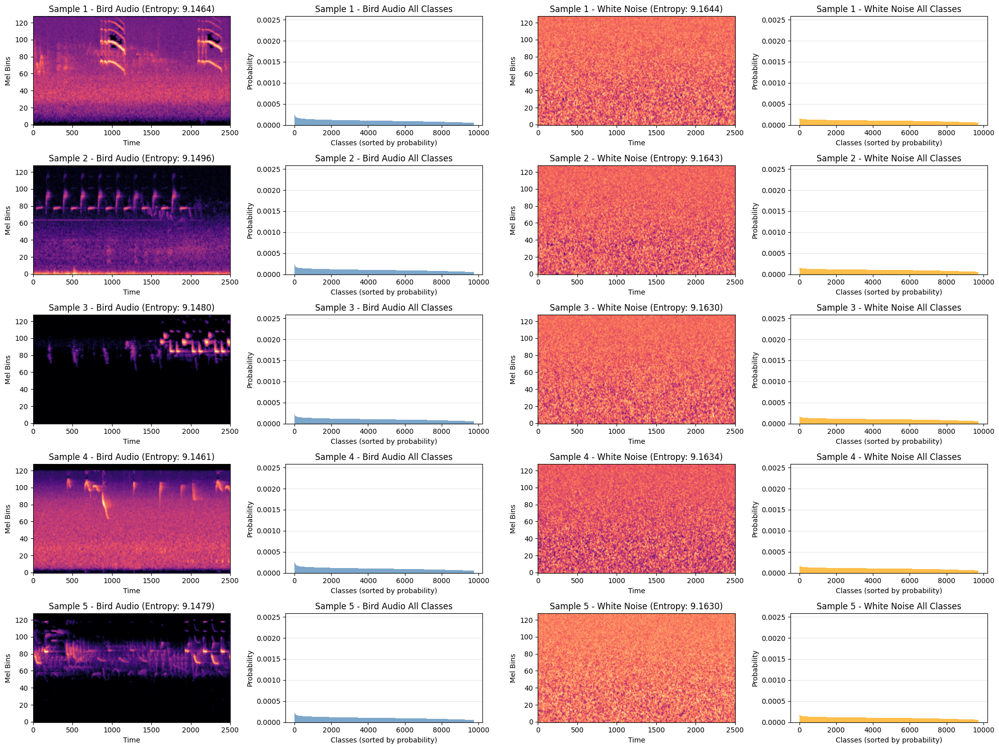

In [115]:
from typing import Any
from scipy.stats import entropy
from transformers import AutoFeatureExtractor, AutoModelForSequenceClassification
import matplotlib.pyplot as plt
import librosa
import torch
import numpy as np

# Load the model and feature extractor
model = AutoModelForSequenceClassification.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
feature_extractor = AutoFeatureExtractor.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
model.eval()

# Parameters
num_samples = 5
segment_duration = 5.0  # 250ms
target_duration = 5.0    # 5 seconds
sample_rate = 32000

# Storage for results
all_probs = []
all_white_noise_probs = []
all_audio_arrays = []
all_white_noise_arrays = []
all_entropies = []
all_white_noise_entropies = []

# Load dataset
ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=sample_rate))
test = ds["train"]

print(f"Processing {num_samples} samples with 250ms segments cyclically padded to 5s...\n")

for idx, ex in enumerate(test.take(num_samples)):
    wav = ex["audio"]["array"]  # np.float32 samples
    sr = ex["audio"]["sampling_rate"]
    
    # Calculate number of samples for segment and target
    segment_samples = int(segment_duration * sr)
    target_samples = int(target_duration * sr)
    
    # Extract random 250ms segment
    if len(wav) > segment_samples:
        start_idx = np.random.randint(0, len(wav) - segment_samples)
        segment = wav[start_idx:start_idx + segment_samples]
    else:
        segment = wav
    
    # Cyclically pad to 5 seconds
    if len(segment) < target_samples:
        num_repeats = int(np.ceil(target_samples / len(segment)))
        padded = np.tile(segment, num_repeats)[:target_samples]
    else:
        padded = segment[:target_samples]
    
    # Store the audio array
    all_audio_arrays.append(padded)
    
    # Process raw audio with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(padded)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits
        # Apply softmax to logits to get probability distribution
        probs = torch.softmax(logits, dim=-1).squeeze()
        
        # Calculate entropy over the softmax distribution
        sample_entropy = entropy(probs.cpu().numpy())
    
    # Store probabilities and entropy
    probs_np = probs.cpu().numpy()
    all_probs.append(probs_np)
    all_entropies.append(sample_entropy)
    
    # Get top prediction
    top_prob, top_idx = torch.max(probs, dim=-1)
    top_label = model.config.id2label[top_idx.item()]
    
    print(f"Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} ({top_prob:.2%})")
    print(f"  Entropy: {sample_entropy:.4f}")
    print()

print(f"Processing {num_samples} white noise samples...\n")

# Generate white noise samples and get predictions
for idx in range(num_samples):
    # Generate white noise for 5 seconds
    target_samples = int(target_duration * sample_rate)
    white_noise = np.random.normal(0, 0.1, target_samples).astype(np.float32)
    
    # Store the white noise array
    all_white_noise_arrays.append(white_noise)
    
    # Process white noise with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(white_noise)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits
        # Apply softmax to logits to get probability distribution
        probs = torch.softmax(logits, dim=-1).squeeze()
        
        # Calculate entropy over the softmax distribution
        sample_entropy = entropy(probs.cpu().numpy())
    
    # Store probabilities and entropy
    probs_np = probs.cpu().numpy()
    all_white_noise_probs.append(probs_np)
    all_white_noise_entropies.append(sample_entropy)
    
    # Get top prediction
    top_prob, top_idx = torch.max(probs, dim=-1)
    top_label = model.config.id2label[top_idx.item()]
    
    print(f"White Noise Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} ({top_prob:.2%})")
    print(f"  Entropy: {sample_entropy:.4f}")
    print()

# Calculate global y-axis limits for consistent scaling (all classes)
all_max_probs = []
for probs in all_probs:
    all_max_probs.append(np.max(probs))
for probs in all_white_noise_probs:
    all_max_probs.append(np.max(probs))
global_y_max = max(all_max_probs) * 1.1

# Create a collage with spectrograms and bar plots for each sample
n_rows = num_samples
n_cols = 4  # Spectrogram, bar plot for bird audio, spectrogram, bar plot for white noise
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Prepare helpful axis bars for time and mel frequencies
hop_length = 64
n_mels = 128

for idx in range(num_samples):
    if n_rows == 1:
        ax_bird_spec = axs[0]
        ax_bird_bar = axs[1]
        ax_noise_spec = axs[2]
        ax_noise_bar = axs[3]
    else:
        ax_bird_spec = axs[idx, 0]
        ax_bird_bar = axs[idx, 1]
        ax_noise_spec = axs[idx, 2]
        ax_noise_bar = axs[idx, 3]
    
    # Bird audio spectrogram
    S_bird = librosa.feature.melspectrogram(y=all_audio_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_bird_dB = librosa.power_to_db(S_bird, ref=np.max)
    ax_bird_spec.imshow(S_bird_dB, origin='lower', aspect='auto', cmap='magma')
    ax_bird_spec.set_title(f'Sample {idx + 1} - Bird Audio (Entropy: {all_entropies[idx]:.4f})')
    ax_bird_spec.set_xlabel('Time')
    ax_bird_spec.set_ylabel('Mel Bins')
    
    # Bird audio bar plot - plot all class probabilities sorted by probability
    probs_bird = all_probs[idx]
    sorted_indices = np.argsort(probs_bird)[::-1]  # Sort from highest to lowest
    sorted_probs = probs_bird[sorted_indices]
    
    x_pos = np.arange(len(sorted_probs))
    ax_bird_bar.bar(x_pos, sorted_probs, color='steelblue', alpha=0.7, edgecolor='none', width=1.0)
    ax_bird_bar.set_xlabel('Classes (sorted by probability)')
    ax_bird_bar.set_ylabel('Probability')
    ax_bird_bar.set_title(f'Sample {idx + 1} - Bird Audio All Classes')
    ax_bird_bar.set_ylim(0, global_y_max)
    ax_bird_bar.grid(axis='y', alpha=0.3)
    
    # White noise spectrogram
    S_noise = librosa.feature.melspectrogram(y=all_white_noise_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_noise_dB = librosa.power_to_db(S_noise, ref=np.max)
    ax_noise_spec.imshow(S_noise_dB, origin='lower', aspect='auto', cmap='magma')
    ax_noise_spec.set_title(f'Sample {idx + 1} - White Noise (Entropy: {all_white_noise_entropies[idx]:.4f})')
    ax_noise_spec.set_xlabel('Time')
    ax_noise_spec.set_ylabel('Mel Bins')
    
    # White noise bar plot - plot all class probabilities sorted by probability
    probs_noise = all_white_noise_probs[idx]
    sorted_indices_noise = np.argsort(probs_noise)[::-1]  # Sort from highest to lowest
    sorted_probs_noise = probs_noise[sorted_indices_noise]
    
    x_pos_noise = np.arange(len(sorted_probs_noise))
    ax_noise_bar.bar(x_pos_noise, sorted_probs_noise, color='orange', alpha=0.7, edgecolor='none', width=1.0)
    ax_noise_bar.set_xlabel('Classes (sorted by probability)')
    ax_noise_bar.set_ylabel('Probability')
    ax_noise_bar.set_title(f'Sample {idx + 1} - White Noise All Classes')
    ax_noise_bar.set_ylim(0, global_y_max)
    ax_noise_bar.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

Processing 5 samples with 250ms segments cyclically padded to 5s...

Sample 1:
  Top prediction: woolar1 (17.65%)
  Avg Binary Entropy (top 20): 0.2780

Sample 2:
  Top prediction: slttro1 (8.90%)
  Avg Binary Entropy (top 20): 0.2849

Sample 3:
  Top prediction: plapri1 (6.46%)
  Avg Binary Entropy (top 20): 0.2861

Sample 4:
  Top prediction: letbar1 (6.69%)
  Avg Binary Entropy (top 20): 0.2859

Sample 5:
  Top prediction: olgcam1 (7.40%)
  Avg Binary Entropy (top 20): 0.2856

Processing 5 white noise samples...

White Noise Sample 1:
  Top prediction: mexchi (7.74%)
  Avg Binary Entropy (top 20): 0.2854

White Noise Sample 2:
  Top prediction: sedwar1 (6.47%)
  Avg Binary Entropy (top 20): 0.2862

White Noise Sample 3:
  Top prediction: afsowl1 (9.52%)
  Avg Binary Entropy (top 20): 0.2848

White Noise Sample 4:
  Top prediction: scadov1 (7.95%)
  Avg Binary Entropy (top 20): 0.2851

White Noise Sample 5:
  Top prediction: spopuf1 (5.77%)
  Avg Binary Entropy (top 20): 0.2863



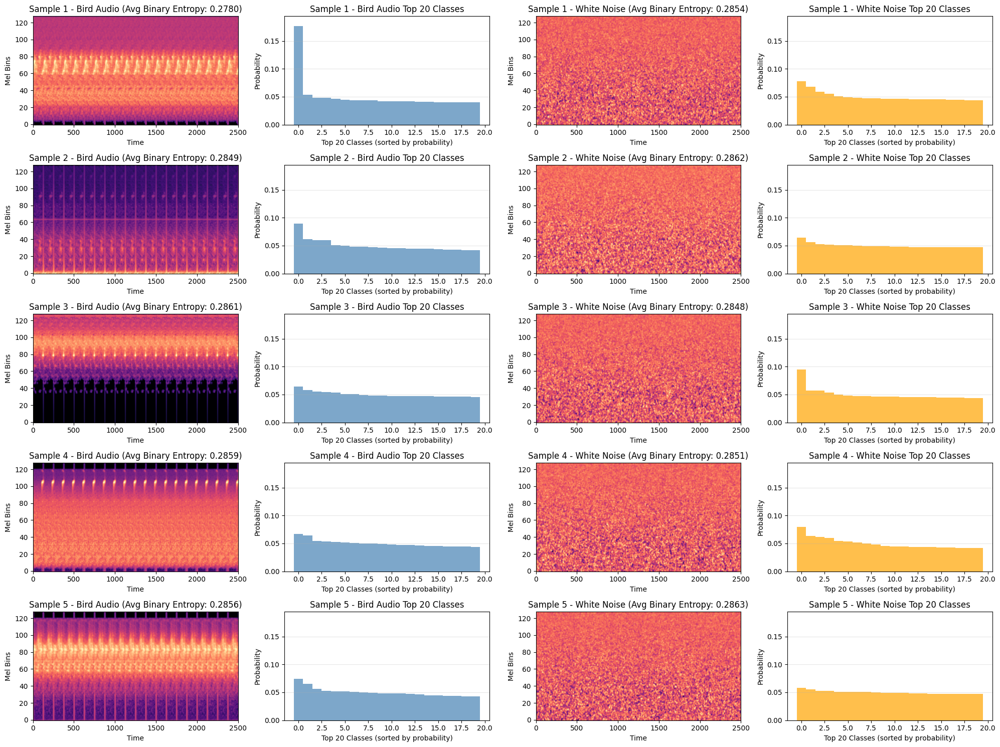

In [109]:
from typing import Any
from scipy.stats import entropy
from transformers import AutoFeatureExtractor, AutoModelForSequenceClassification
import matplotlib.pyplot as plt
import librosa
import torch
import numpy as np

# Load the model and feature extractor
model = AutoModelForSequenceClassification.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
feature_extractor = AutoFeatureExtractor.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
model.eval()

# Parameters
num_samples = 5
segment_duration = 0.250  # 250ms
target_duration = 5.0    # 5 seconds
sample_rate = 32000

# Storage for results
all_probs = []
all_white_noise_probs = []
all_audio_arrays = []
all_white_noise_arrays = []
all_entropies = []
all_white_noise_entropies = []

# Load dataset
ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=sample_rate))
test = ds["train"]

def binary_entropy(p):
    """Calculate binary entropy for a single probability value"""
    # Clip to avoid log(0)
    p = np.clip(p, 1e-10, 1 - 1e-10)
    return -p * np.log2(p) - (1 - p) * np.log2(1 - p)

print(f"Processing {num_samples} samples with 250ms segments cyclically padded to 5s...\n")

for idx, ex in enumerate(test.take(num_samples)):
    wav = ex["audio"]["array"]  # np.float32 samples
    sr = ex["audio"]["sampling_rate"]
    
    # Calculate number of samples for segment and target
    segment_samples = int(segment_duration * sr)
    target_samples = int(target_duration * sr)
    
    # Extract random 250ms segment
    if len(wav) > segment_samples:
        start_idx = np.random.randint(0, len(wav) - segment_samples)
        segment = wav[start_idx:start_idx + segment_samples]
    else:
        segment = wav
    
    # Cyclically pad to 5 seconds
    if len(segment) < target_samples:
        num_repeats = int(np.ceil(target_samples / len(segment)))
        padded = np.tile(segment, num_repeats)[:target_samples]
    else:
        padded = segment[:target_samples]
    
    # Store the audio array
    all_audio_arrays.append(padded)
    
    # Process raw audio with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(padded)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits
        
        # Get top 20 logits and apply softmax only to them
        top_20_indices = torch.topk(logits.squeeze(), k=20).indices
        top_20_logits = logits.squeeze()[top_20_indices]
        top_20_probs = torch.softmax(top_20_logits, dim=-1).cpu().numpy()
        
        # Create full probability array with zeros and fill in top 20
        probs_np = np.zeros(logits.shape[-1])
        probs_np[top_20_indices.cpu().numpy()] = top_20_probs
        
        # Calculate average binary entropy for each of the top 20 probabilities
        sample_entropy = np.mean([binary_entropy(p) for p in top_20_probs])
    
    # Store probabilities and entropy
    all_probs.append(probs_np)
    all_entropies.append(sample_entropy)
    
    # Get top prediction
    top_idx = top_20_indices[0].item()
    top_prob = top_20_probs[0]
    top_label = model.config.id2label[top_idx]
    
    print(f"Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} ({top_prob:.2%})")
    print(f"  Avg Binary Entropy (top 20): {sample_entropy:.4f}")
    print()

print(f"Processing {num_samples} white noise samples...\n")

# Generate white noise samples and get predictions
for idx in range(num_samples):
    # Generate white noise for 5 seconds
    target_samples = int(target_duration * sample_rate)
    white_noise = np.random.normal(0, 0.1, target_samples).astype(np.float32)
    
    # Store the white noise array
    all_white_noise_arrays.append(white_noise)
    
    # Process white noise with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(white_noise)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits
        
        # Get top 20 logits and apply softmax only to them
        top_20_indices = torch.topk(logits.squeeze(), k=20).indices
        top_20_logits = logits.squeeze()[top_20_indices]
        top_20_probs = torch.softmax(top_20_logits, dim=-1).cpu().numpy()
        
        # Create full probability array with zeros and fill in top 20
        probs_np = np.zeros(logits.shape[-1])
        probs_np[top_20_indices.cpu().numpy()] = top_20_probs
        
        # Calculate average binary entropy for each of the top 20 probabilities
        sample_entropy = np.mean([binary_entropy(p) for p in top_20_probs])
    
    # Store probabilities and entropy
    all_white_noise_probs.append(probs_np)
    all_white_noise_entropies.append(sample_entropy)
    
    # Get top prediction
    top_idx = top_20_indices[0].item()
    top_prob = top_20_probs[0]
    top_label = model.config.id2label[top_idx]
    
    print(f"White Noise Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} ({top_prob:.2%})")
    print(f"  Avg Binary Entropy (top 20): {sample_entropy:.4f}")
    print()

# Calculate global y-axis limits for consistent scaling (top 20 only)
all_max_probs = []
for probs in all_probs:
    top_20_probs = np.sort(probs)[-20:]  # Get top 20 probabilities
    all_max_probs.append(np.max(top_20_probs))
for probs in all_white_noise_probs:
    top_20_probs = np.sort(probs)[-20:]  # Get top 20 probabilities
    all_max_probs.append(np.max(top_20_probs))
global_y_max = max(all_max_probs) * 1.1

# Create a collage with spectrograms and bar plots for each sample
n_rows = num_samples
n_cols = 4  # Spectrogram, bar plot for bird audio, spectrogram, bar plot for white noise
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Prepare helpful axis bars for time and mel frequencies
hop_length = 64
n_mels = 128

for idx in range(num_samples):
    if n_rows == 1:
        ax_bird_spec = axs[0]
        ax_bird_bar = axs[1]
        ax_noise_spec = axs[2]
        ax_noise_bar = axs[3]
    else:
        ax_bird_spec = axs[idx, 0]
        ax_bird_bar = axs[idx, 1]
        ax_noise_spec = axs[idx, 2]
        ax_noise_bar = axs[idx, 3]
    
    # Bird audio spectrogram
    S_bird = librosa.feature.melspectrogram(y=all_audio_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_bird_dB = librosa.power_to_db(S_bird, ref=np.max)
    ax_bird_spec.imshow(S_bird_dB, origin='lower', aspect='auto', cmap='magma')
    ax_bird_spec.set_title(f'Sample {idx + 1} - Bird Audio (Avg Binary Entropy: {all_entropies[idx]:.4f})')
    ax_bird_spec.set_xlabel('Time')
    ax_bird_spec.set_ylabel('Mel Bins')
    
    # Bird audio bar plot - sort by probability and take top 20
    probs_bird = all_probs[idx]
    sorted_indices = np.argsort(probs_bird)[::-1]  # Sort in descending order
    top_20_indices = sorted_indices[:20]  # Take top 20
    top_20_probs = probs_bird[top_20_indices]
    
    # Plot top 20 classes without labels
    x_pos = np.arange(len(top_20_probs))
    ax_bird_bar.bar(x_pos, top_20_probs, color='steelblue', alpha=0.7, edgecolor='none', width=1.0)
    ax_bird_bar.set_xlabel('Top 20 Classes (sorted by probability)')
    ax_bird_bar.set_ylabel('Probability')
    ax_bird_bar.set_title(f'Sample {idx + 1} - Bird Audio Top 20 Classes')
    ax_bird_bar.set_ylim(0, global_y_max)
    ax_bird_bar.grid(axis='y', alpha=0.3)
    
    # White noise spectrogram
    S_noise = librosa.feature.melspectrogram(y=all_white_noise_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_noise_dB = librosa.power_to_db(S_noise, ref=np.max)
    ax_noise_spec.imshow(S_noise_dB, origin='lower', aspect='auto', cmap='magma')
    ax_noise_spec.set_title(f'Sample {idx + 1} - White Noise (Avg Binary Entropy: {all_white_noise_entropies[idx]:.4f})')
    ax_noise_spec.set_xlabel('Time')
    ax_noise_spec.set_ylabel('Mel Bins')
    
    # White noise bar plot - sort by probability and take top 20
    probs_noise = all_white_noise_probs[idx]
    sorted_indices_noise = np.argsort(probs_noise)[::-1]  # Sort in descending order
    top_20_indices_noise = sorted_indices_noise[:20]  # Take top 20
    top_20_probs_noise = probs_noise[top_20_indices_noise]
    
    # Plot top 20 classes without labels
    x_pos_noise = np.arange(len(top_20_probs_noise))
    ax_noise_bar.bar(x_pos_noise, top_20_probs_noise, color='orange', alpha=0.7, edgecolor='none', width=1.0)
    ax_noise_bar.set_xlabel('Top 20 Classes (sorted by probability)')
    ax_noise_bar.set_ylabel('Probability')
    ax_noise_bar.set_title(f'Sample {idx + 1} - White Noise Top 20 Classes')
    ax_noise_bar.set_ylim(0, global_y_max)
    ax_noise_bar.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Raw Logits

Processing 5 samples with 250ms segments cyclically padded to 5s...

Sample 1:
  Top prediction: eurnig1 (logit: -0.7308)
  Entropy (top 20): 4.3022

Sample 2:
  Top prediction: plapri1 (logit: -0.8260)
  Entropy (top 20): 4.3090

Sample 3:
  Top prediction: gretit1 (logit: 0.2059)
  Entropy (top 20): 4.1686

Sample 4:
  Top prediction: whcsap1 (logit: -0.1064)
  Entropy (top 20): 4.2330

Sample 5:
  Top prediction: swaspa (logit: -0.4571)
  Entropy (top 20): 4.2791

Processing 5 white noise samples...

White Noise Sample 1:
  Top prediction: sedwar1 (logit: -1.1478)
  Entropy (top 20): 4.3161

White Noise Sample 2:
  Top prediction: grswoo (logit: -1.1923)
  Entropy (top 20): 4.3176

White Noise Sample 3:
  Top prediction: blackc1 (logit: -1.2106)
  Entropy (top 20): 4.3182

White Noise Sample 4:
  Top prediction: gryfin2 (logit: -1.3359)
  Entropy (top 20): 4.3202

White Noise Sample 5:
  Top prediction: gryfin2 (logit: -1.2459)
  Entropy (top 20): 4.3191



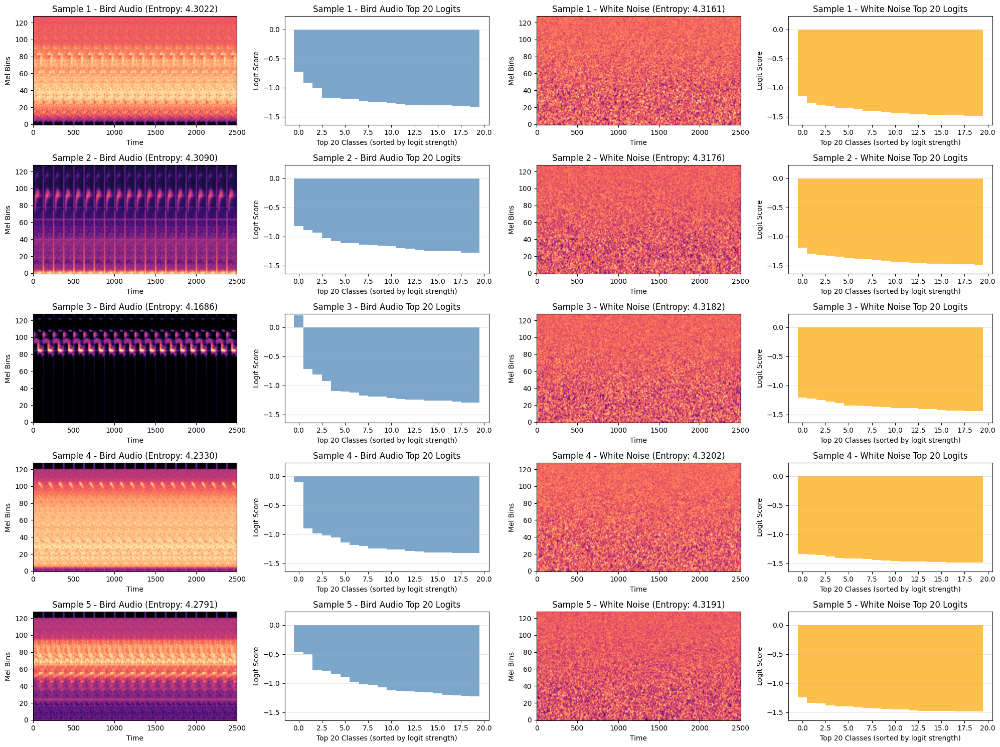

In [110]:
from typing import Any
from scipy.stats import entropy
from transformers import AutoFeatureExtractor, AutoModelForSequenceClassification
import matplotlib.pyplot as plt
import librosa
import torch
import numpy as np

# Load the model and feature extractor
model = AutoModelForSequenceClassification.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
feature_extractor = AutoFeatureExtractor.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
model.eval()

# Parameters
num_samples = 5
segment_duration = 0.250  # 250ms
target_duration = 5.0    # 5 seconds
sample_rate = 32000

# Storage for results
all_logits = []
all_white_noise_logits = []
all_audio_arrays = []
all_white_noise_arrays = []
all_entropies = []
all_white_noise_entropies = []

# Load dataset
ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=sample_rate))
test = ds["train"]

print(f"Processing {num_samples} samples with 250ms segments cyclically padded to 5s...\n")

for idx, ex in enumerate(test.take(num_samples)):
    wav = ex["audio"]["array"]  # np.float32 samples
    sr = ex["audio"]["sampling_rate"]
    
    # Calculate number of samples for segment and target
    segment_samples = int(segment_duration * sr)
    target_samples = int(target_duration * sr)
    
    # Extract random 250ms segment
    if len(wav) > segment_samples:
        start_idx = np.random.randint(0, len(wav) - segment_samples)
        segment = wav[start_idx:start_idx + segment_samples]
    else:
        segment = wav
    
    # Cyclically pad to 5 seconds
    if len(segment) < target_samples:
        num_repeats = int(np.ceil(target_samples / len(segment)))
        padded = np.tile(segment, num_repeats)[:target_samples]
    else:
        padded = segment[:target_samples]
    
    # Store the audio array
    all_audio_arrays.append(padded)
    
    # Process raw audio with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(padded)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits.squeeze().cpu().numpy()
        
        # Get top 20 logits for entropy calculation
        top_20_indices = np.argsort(logits)[::-1][:20]
        top_20_logits = logits[top_20_indices]
        
        # Apply softmax to top 20 logits to get probability distribution
        top_20_probs = torch.softmax(torch.tensor(top_20_logits), dim=-1).numpy()
        
        # Calculate entropy using top 20 probabilities: H(xi) = -sum(p * log(p))
        sample_entropy = -np.sum(top_20_probs * np.log2(top_20_probs + 1e-12))  # Add small epsilon to avoid log(0)
    
    # Store top 20 logits and entropy
    all_logits.append(top_20_logits)
    all_entropies.append(sample_entropy)
    
    # Get top prediction
    top_idx = np.argmax(top_20_logits)
    top_logit = top_20_logits[top_idx]
    top_label = model.config.id2label[top_20_indices[top_idx]]
    
    print(f"Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} (logit: {top_logit:.4f})")
    print(f"  Entropy (top 20): {sample_entropy:.4f}")
    print()

print(f"Processing {num_samples} white noise samples...\n")

# Generate white noise samples and get predictions
for idx in range(num_samples):
    # Generate white noise for 5 seconds
    target_samples = int(target_duration * sample_rate)
    white_noise = np.random.normal(0, 0.1, target_samples).astype(np.float32)
    
    # Store the white noise array
    all_white_noise_arrays.append(white_noise)
    
    # Process white noise with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(white_noise)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits.squeeze().cpu().numpy()
        
        # Get top 20 logits for entropy calculation
        top_20_indices = np.argsort(logits)[::-1][:20]
        top_20_logits = logits[top_20_indices]
        
        # Apply softmax to top 20 logits to get probability distribution
        top_20_probs = torch.softmax(torch.tensor(top_20_logits), dim=-1).numpy()
        
        # Calculate entropy using top 20 probabilities: H(xi) = -sum(p * log(p))
        sample_entropy = -np.sum(top_20_probs * np.log2(top_20_probs + 1e-12))  # Add small epsilon to avoid log(0)
    
    # Store top 20 logits and entropy
    all_white_noise_logits.append(top_20_logits)
    all_white_noise_entropies.append(sample_entropy)
    
    # Get top prediction
    top_idx = np.argmax(top_20_logits)
    top_logit = top_20_logits[top_idx]
    top_label = model.config.id2label[top_20_indices[top_idx]]
    
    print(f"White Noise Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} (logit: {top_logit:.4f})")
    print(f"  Entropy (top 20): {sample_entropy:.4f}")
    print()

# Calculate global y-axis limits for consistent scaling (top 20 logits only)
all_max_logits = []
all_min_logits = []
for logits in all_logits:
    all_max_logits.append(np.max(logits))
    all_min_logits.append(np.min(logits))
for logits in all_white_noise_logits:
    all_max_logits.append(np.max(logits))
    all_min_logits.append(np.min(logits))
global_y_max = max(all_max_logits) * 1.1
global_y_min = min(all_min_logits) * 1.1

# Create a collage with spectrograms and bar plots for each sample
n_rows = num_samples
n_cols = 4  # Spectrogram, bar plot for bird audio, spectrogram, bar plot for white noise
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Prepare helpful axis bars for time and mel frequencies
hop_length = 64
n_mels = 128

for idx in range(num_samples):
    if n_rows == 1:
        ax_bird_spec = axs[0]
        ax_bird_bar = axs[1]
        ax_noise_spec = axs[2]
        ax_noise_bar = axs[3]
    else:
        ax_bird_spec = axs[idx, 0]
        ax_bird_bar = axs[idx, 1]
        ax_noise_spec = axs[idx, 2]
        ax_noise_bar = axs[idx, 3]
    
    # Bird audio spectrogram
    S_bird = librosa.feature.melspectrogram(y=all_audio_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_bird_dB = librosa.power_to_db(S_bird, ref=np.max)
    ax_bird_spec.imshow(S_bird_dB, origin='lower', aspect='auto', cmap='magma')
    ax_bird_spec.set_title(f'Sample {idx + 1} - Bird Audio (Entropy: {all_entropies[idx]:.4f})')
    ax_bird_spec.set_xlabel('Time')
    ax_bird_spec.set_ylabel('Mel Bins')
    
    # Bird audio bar plot - top 20 logits already sorted by activation strength
    logits_bird = all_logits[idx]
    x_pos = np.arange(len(logits_bird))
    ax_bird_bar.bar(x_pos, logits_bird, color='steelblue', alpha=0.7, edgecolor='none', width=1.0)
    ax_bird_bar.set_xlabel('Top 20 Classes (sorted by logit strength)')
    ax_bird_bar.set_ylabel('Logit Score')
    ax_bird_bar.set_title(f'Sample {idx + 1} - Bird Audio Top 20 Logits')
    ax_bird_bar.set_ylim(global_y_min, global_y_max)
    ax_bird_bar.grid(axis='y', alpha=0.3)
    
    # White noise spectrogram
    S_noise = librosa.feature.melspectrogram(y=all_white_noise_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_noise_dB = librosa.power_to_db(S_noise, ref=np.max)
    ax_noise_spec.imshow(S_noise_dB, origin='lower', aspect='auto', cmap='magma')
    ax_noise_spec.set_title(f'Sample {idx + 1} - White Noise (Entropy: {all_white_noise_entropies[idx]:.4f})')
    ax_noise_spec.set_xlabel('Time')
    ax_noise_spec.set_ylabel('Mel Bins')
    
    # White noise bar plot - top 20 logits already sorted by activation strength
    logits_noise = all_white_noise_logits[idx]
    x_pos_noise = np.arange(len(logits_noise))
    ax_noise_bar.bar(x_pos_noise, logits_noise, color='orange', alpha=0.7, edgecolor='none', width=1.0)
    ax_noise_bar.set_xlabel('Top 20 Classes (sorted by logit strength)')
    ax_noise_bar.set_ylabel('Logit Score')
    ax_noise_bar.set_title(f'Sample {idx + 1} - White Noise Top 20 Logits')
    ax_noise_bar.set_ylim(global_y_min, global_y_max)
    ax_noise_bar.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Maginutude of Logit Activation

Processing 5 samples with 250ms segments cyclically padded to 5s...

Sample 1:
  Top prediction: plapri1 (logit: -0.8760)
  Entropy (top 20): 4.3068

Sample 2:
  Top prediction: whsant2 (logit: -0.4414)
  Entropy (top 20): 4.2773

Sample 3:
  Top prediction: larbun (logit: -0.9719)
  Entropy (top 20): 4.3132

Sample 4:
  Top prediction: gymwre1 (logit: -0.7843)
  Entropy (top 20): 4.3075

Sample 5:
  Top prediction: woolar1 (logit: -0.7127)
  Entropy (top 20): 4.2972

Processing 5 white noise samples...

White Noise Sample 1:
  Top prediction: blackc1 (logit: -0.9104)
  Entropy (top 20): 4.3119

White Noise Sample 2:
  Top prediction: monoro1 (logit: -0.7757)
  Entropy (top 20): 4.3000

White Noise Sample 3:
  Top prediction: blackc1 (logit: -1.2435)
  Entropy (top 20): 4.3194

White Noise Sample 4:
  Top prediction: monpar (logit: -1.1190)
  Entropy (top 20): 4.3180

White Noise Sample 5:
  Top prediction: grswoo (logit: -1.3047)
  Entropy (top 20): 4.3199



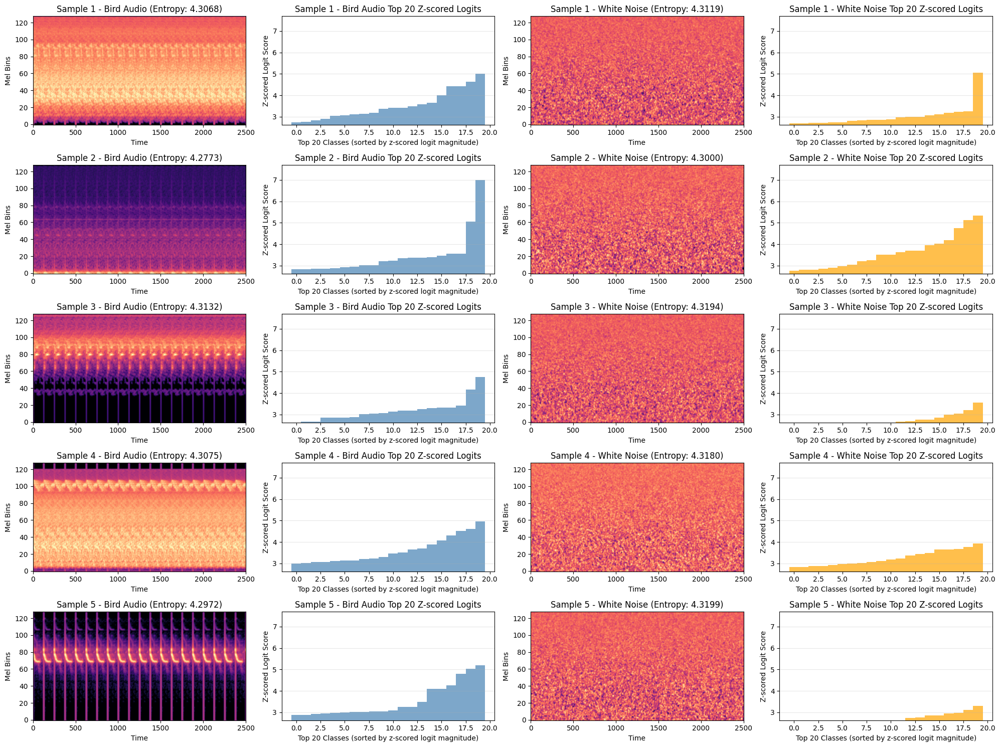

In [111]:
from typing import Any
from scipy.stats import entropy
from transformers import AutoFeatureExtractor, AutoModelForSequenceClassification
import matplotlib.pyplot as plt
import librosa
import torch
import numpy as np

# Load the model and feature extractor
model = AutoModelForSequenceClassification.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
feature_extractor = AutoFeatureExtractor.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
model.eval()

# Parameters
num_samples = 5
segment_duration = 0.25  # 250ms
target_duration = 5.0    # 5 seconds
sample_rate = 32000

# Storage for results
all_logits = []
all_white_noise_logits = []
all_audio_arrays = []
all_white_noise_arrays = []
all_entropies = []
all_white_noise_entropies = []

# Load dataset
ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=sample_rate))
test = ds["train"]

print(f"Processing {num_samples} samples with 250ms segments cyclically padded to 5s...\n")

for idx, ex in enumerate(test.take(num_samples)):
    wav = ex["audio"]["array"]  # np.float32 samples
    sr = ex["audio"]["sampling_rate"]
    
    # Calculate number of samples for segment and target
    segment_samples = int(segment_duration * sr)
    target_samples = int(target_duration * sr)
    
    # Extract random 250ms segment
    if len(wav) > segment_samples:
        start_idx = np.random.randint(0, len(wav) - segment_samples)
        segment = wav[start_idx:start_idx + segment_samples]
    else:
        segment = wav
    
    # Cyclically pad to 5 seconds
    if len(segment) < target_samples:
        num_repeats = int(np.ceil(target_samples / len(segment)))
        padded = np.tile(segment, num_repeats)[:target_samples]
    else:
        padded = segment[:target_samples]
    
    # Store the audio array
    all_audio_arrays.append(padded)
    
    # Process raw audio with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(padded)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits.squeeze().cpu().numpy()
        
        # Z-score normalize all logits
        z_scored_logits = (logits - np.mean(logits)) / np.std(logits)
        
        # Get top 20 z-scored logits
        top_20_indices = np.argsort(z_scored_logits)[::-1][:20]
        top_20_z_scored_logits = z_scored_logits[top_20_indices]
        
        # Apply softmax to top 20 original logits to get probability distribution for entropy
        top_20_original_logits = logits[top_20_indices]
        top_20_probs = torch.softmax(torch.tensor(top_20_original_logits), dim=-1).numpy()
        
        # Calculate entropy using top 20 probabilities: H(xi) = -sum(p * log(p))
        sample_entropy = -np.sum(top_20_probs * np.log2(top_20_probs + 1e-12))  # Add small epsilon to avoid log(0)
    
    # Store top 20 z-scored logits and entropy
    all_logits.append(top_20_z_scored_logits)
    all_entropies.append(sample_entropy)
    
    # Get top prediction (using original logits)
    top_idx = np.argmax(logits)
    top_logit = logits[top_idx]
    top_label = model.config.id2label[top_idx]
    
    print(f"Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} (logit: {top_logit:.4f})")
    print(f"  Entropy (top 20): {sample_entropy:.4f}")
    print()

print(f"Processing {num_samples} white noise samples...\n")

# Generate white noise samples and get predictions
for idx in range(num_samples):
    # Generate white noise for 5 seconds
    target_samples = int(target_duration * sample_rate)
    white_noise = np.random.normal(0, 0.1, target_samples).astype(np.float32)
    
    # Store the white noise array
    all_white_noise_arrays.append(white_noise)
    
    # Process white noise with feature extractor and get model predictions
    mel_spectrogram = feature_extractor(white_noise)
    
    with torch.no_grad():
        outputs = model(mel_spectrogram)
        logits = outputs.logits.squeeze().cpu().numpy()
        
        # Z-score normalize all logits
        z_scored_logits = (logits - np.mean(logits)) / np.std(logits)
        
        # Get top 20 z-scored logits
        top_20_indices = np.argsort(z_scored_logits)[::-1][:20]
        top_20_z_scored_logits = z_scored_logits[top_20_indices]
        
        # Apply softmax to top 20 original logits to get probability distribution for entropy
        top_20_original_logits = logits[top_20_indices]
        top_20_probs = torch.softmax(torch.tensor(top_20_original_logits), dim=-1).numpy()
        
        # Calculate entropy using top 20 probabilities: H(xi) = -sum(p * log(p))
        sample_entropy = -np.sum(top_20_probs * np.log2(top_20_probs + 1e-12))  # Add small epsilon to avoid log(0)
    
    # Store top 20 z-scored logits and entropy
    all_white_noise_logits.append(top_20_z_scored_logits)
    all_white_noise_entropies.append(sample_entropy)
    
    # Get top prediction (using original logits)
    top_idx = np.argmax(logits)
    top_logit = logits[top_idx]
    top_label = model.config.id2label[top_idx]
    
    print(f"White Noise Sample {idx + 1}:")
    print(f"  Top prediction: {top_label} (logit: {top_logit:.4f})")
    print(f"  Entropy (top 20): {sample_entropy:.4f}")
    print()

# Calculate global y-axis limits for consistent scaling (top 20 z-scored logits)
all_max_logits = []
all_min_logits = []
for logits in all_logits:
    all_max_logits.append(np.max(logits))
    all_min_logits.append(np.min(logits))
for logits in all_white_noise_logits:
    all_max_logits.append(np.max(logits))
    all_min_logits.append(np.min(logits))
global_y_max = max(all_max_logits) * 1.1
global_y_min = min(all_min_logits) * 1.1

# Create a collage with spectrograms and bar plots for each sample
n_rows = num_samples
n_cols = 4  # Spectrogram, bar plot for bird audio, spectrogram, bar plot for white noise
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Prepare helpful axis bars for time and mel frequencies
hop_length = 64
n_mels = 128

for idx in range(num_samples):
    if n_rows == 1:
        ax_bird_spec = axs[0]
        ax_bird_bar = axs[1]
        ax_noise_spec = axs[2]
        ax_noise_bar = axs[3]
    else:
        ax_bird_spec = axs[idx, 0]
        ax_bird_bar = axs[idx, 1]
        ax_noise_spec = axs[idx, 2]
        ax_noise_bar = axs[idx, 3]
    
    # Bird audio spectrogram
    S_bird = librosa.feature.melspectrogram(y=all_audio_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_bird_dB = librosa.power_to_db(S_bird, ref=np.max)
    ax_bird_spec.imshow(S_bird_dB, origin='lower', aspect='auto', cmap='magma')
    ax_bird_spec.set_title(f'Sample {idx + 1} - Bird Audio (Entropy: {all_entropies[idx]:.4f})')
    ax_bird_spec.set_xlabel('Time')
    ax_bird_spec.set_ylabel('Mel Bins')
    
    # Bird audio bar plot - top 20 z-scored logits sorted in ascending order
    logits_bird = all_logits[idx]
    sorted_logits_bird = np.sort(logits_bird)  # Sort in ascending order
    x_pos = np.arange(len(sorted_logits_bird))
    ax_bird_bar.bar(x_pos, sorted_logits_bird, color='steelblue', alpha=0.7, edgecolor='none', width=1.0)
    ax_bird_bar.set_xlabel('Top 20 Classes (sorted by z-scored logit magnitude)')
    ax_bird_bar.set_ylabel('Z-scored Logit Score')
    ax_bird_bar.set_title(f'Sample {idx + 1} - Bird Audio Top 20 Z-scored Logits')
    ax_bird_bar.set_ylim(global_y_min, global_y_max)
    ax_bird_bar.grid(axis='y', alpha=0.3)
    
    # White noise spectrogram
    S_noise = librosa.feature.melspectrogram(y=all_white_noise_arrays[idx], sr=sample_rate, n_mels=n_mels, hop_length=hop_length)
    S_noise_dB = librosa.power_to_db(S_noise, ref=np.max)
    ax_noise_spec.imshow(S_noise_dB, origin='lower', aspect='auto', cmap='magma')
    ax_noise_spec.set_title(f'Sample {idx + 1} - White Noise (Entropy: {all_white_noise_entropies[idx]:.4f})')
    ax_noise_spec.set_xlabel('Time')
    ax_noise_spec.set_ylabel('Mel Bins')
    
    # White noise bar plot - top 20 z-scored logits sorted in ascending order
    logits_noise = all_white_noise_logits[idx]
    sorted_logits_noise = np.sort(logits_noise)  # Sort in ascending order
    x_pos_noise = np.arange(len(sorted_logits_noise))
    ax_noise_bar.bar(x_pos_noise, sorted_logits_noise, color='orange', alpha=0.7, edgecolor='none', width=1.0)
    ax_noise_bar.set_xlabel('Top 20 Classes (sorted by z-scored logit magnitude)')
    ax_noise_bar.set_ylabel('Z-scored Logit Score')
    ax_noise_bar.set_title(f'Sample {idx + 1} - White Noise Top 20 Z-scored Logits')
    ax_noise_bar.set_ylim(global_y_min, global_y_max)
    ax_noise_bar.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Area Under the Curve for 250ms timeblocks over course of whole song 


Analyzing song 1 of length 29.41 seconds...
Using 250ms segments with 250ms hop
Total windows to process: 117
Processing windows...
Processed 0/117 windows...
Processed 100/117 windows...
Completed processing 117 windows


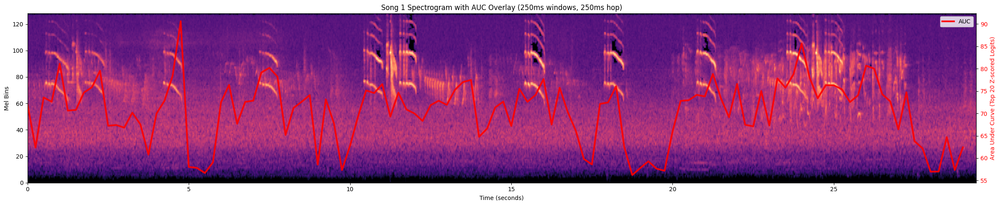


AUC Statistics for Song 1:
Mean AUC: 70.4069
Std AUC: 6.9792
Min AUC: 56.2150
Max AUC: 90.6330

Analyzing song 2 of length 12.62 seconds...
Using 250ms segments with 250ms hop
Total windows to process: 50
Processing windows...
Processed 0/50 windows...
Completed processing 50 windows


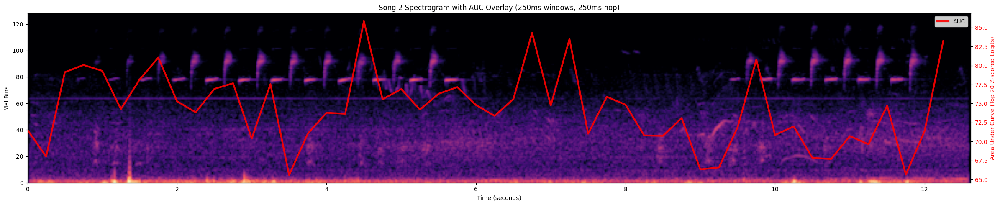


AUC Statistics for Song 2:
Mean AUC: 74.3062
Std AUC: 4.8420
Min AUC: 65.5974
Max AUC: 85.8265

Analyzing song 3 of length 15.94 seconds...
Using 250ms segments with 250ms hop
Total windows to process: 63
Processing windows...
Processed 0/63 windows...
Completed processing 63 windows


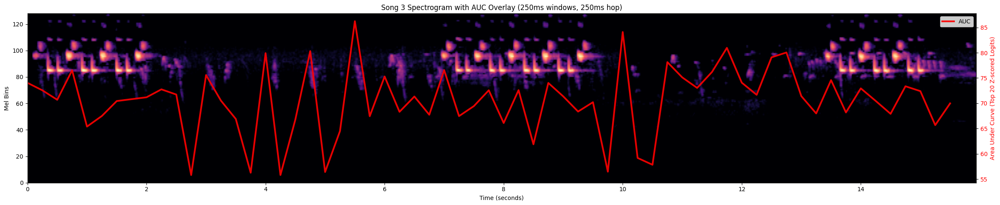


AUC Statistics for Song 3:
Mean AUC: 70.4880
Std AUC: 6.6786
Min AUC: 55.8306
Max AUC: 86.2251

Analyzing song 4 of length 77.96 seconds...
Using 250ms segments with 250ms hop
Total windows to process: 311
Processing windows...
Processed 0/311 windows...
Processed 100/311 windows...
Processed 200/311 windows...
Processed 300/311 windows...
Completed processing 311 windows


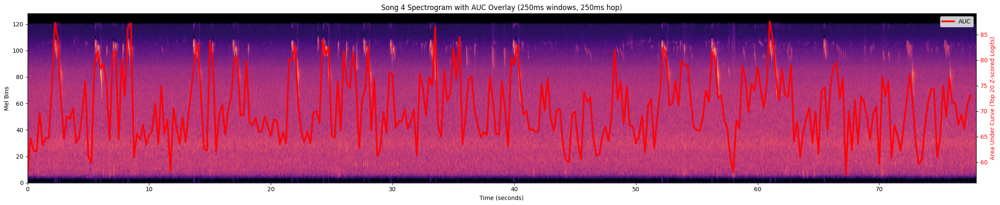


AUC Statistics for Song 4:
Mean AUC: 70.6152
Std AUC: 6.5416
Min AUC: 57.4971
Max AUC: 87.6118

Analyzing song 5 of length 118.58 seconds...
Using 250ms segments with 250ms hop
Total windows to process: 474
Processing windows...
Processed 0/474 windows...
Processed 100/474 windows...
Processed 200/474 windows...
Processed 300/474 windows...
Processed 400/474 windows...
Completed processing 474 windows


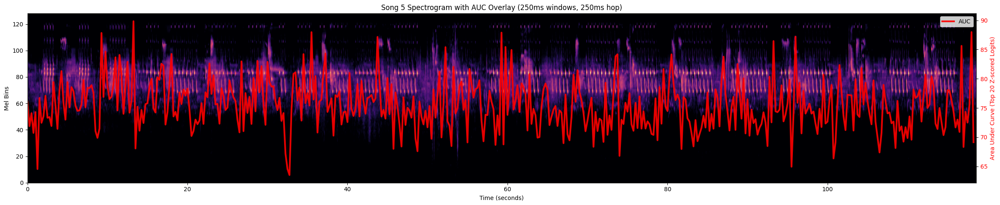


AUC Statistics for Song 5:
Mean AUC: 75.3754
Std AUC: 4.2040
Min AUC: 63.5218
Max AUC: 89.8502
Max AUC: 89.8502


In [114]:
from typing import Any
from scipy.stats import entropy
from transformers import AutoFeatureExtractor, AutoModelForSequenceClassification
import matplotlib.pyplot as plt
import librosa
import torch
import numpy as np

# Load the model and feature extractor
model = AutoModelForSequenceClassification.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
feature_extractor = AutoFeatureExtractor.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
model.eval()

# Parameters
segment_duration = .25  # 250ms
target_duration = 5.0    # 5 seconds for zero padding
sample_rate = 32000
hop_duration = .25     # 125ms hop (50% overlap)

# Load dataset
ds = load_dataset("DBD-research-group/BirdSet", "XCM", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=sample_rate))
test = ds["train"]

# Get 5 songs for analysis
songs_data = list(test.take(5))

# Process each song
for song_idx, song_data in enumerate(songs_data):
    wav = song_data["audio"]["array"]  # np.float32 samples
    sr = song_data["audio"]["sampling_rate"]

    print(f"\nAnalyzing song {song_idx + 1} of length {len(wav)/sr:.2f} seconds...")
    print(f"Using 250ms segments with 250ms hop")

    # Calculate number of samples for segment, target, and hop
    segment_samples = int(segment_duration * sr)
    target_samples = int(target_duration * sr)
    hop_samples = int(hop_duration * sr)

    # Calculate number of windows
    num_windows = (len(wav) - segment_samples) // hop_samples + 1
    print(f"Total windows to process: {num_windows}")

    # Storage for results
    window_aucs = []
    window_times = []

    print("Processing windows...")

    for window_idx in range(num_windows):
        # Extract 250ms segment
        start_idx = window_idx * hop_samples
        end_idx = start_idx + segment_samples
        
        if end_idx > len(wav):
            break
            
        segment = wav[start_idx:end_idx]
        
        # Zero pad to 5 seconds
        if len(segment) < target_samples:
            padded = np.zeros(target_samples)
            padded[:len(segment)] = segment
        else:
            padded = segment[:target_samples]
        
        # Process with feature extractor and get model predictions
        mel_spectrogram = feature_extractor(padded)
        
        with torch.no_grad():
            outputs = model(mel_spectrogram)
            logits = outputs.logits.squeeze().cpu().numpy()
            
            # Z-score normalize all logits
            z_scored_logits = (logits - np.mean(logits)) / np.std(logits)
            
            # Get top 20 z-scored logits
            top_20_indices = np.argsort(z_scored_logits)[::-1][:20]
            top_20_z_scored_logits = z_scored_logits[top_20_indices]
            
            # Sort the top 20 z-scores in ascending order for AUC calculation
            sorted_z_scores = np.sort(top_20_z_scored_logits)
            
            # Calculate AUC using trapezoidal rule
            auc = np.trapezoid(sorted_z_scores, dx=1)
        
        # Store results
        window_aucs.append(auc)
        window_times.append(start_idx / sr)  # Convert to seconds
        
        if window_idx % 100 == 0:
            print(f"Processed {window_idx}/{num_windows} windows...")

    print(f"Completed processing {len(window_aucs)} windows")

    # Create the combined plot with spectrogram and AUC overlay
    fig, ax = plt.subplots(1, 1, figsize=(24, 5))

    # Plot spectrogram
    S = librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=128, hop_length=512)
    S_dB = librosa.power_to_db(S, ref=np.max)
    img = ax.imshow(S_dB, origin='lower', aspect='auto', cmap='magma', 
                    extent=[0, len(wav)/sr, 0, 128])
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel('Mel Bins')
    ax.set_title(f'Song {song_idx + 1} Spectrogram with AUC Overlay (250ms windows, 250ms hop)')

    # Create secondary y-axis for AUC line plot
    ax2 = ax.twinx()
    ax2.plot(window_times, window_aucs, linewidth=3, color='red', alpha=0.9, label='AUC')
    ax2.set_ylabel('Area Under Curve (Top 20 Z-scored Logits)', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

    # Print some statistics
    print(f"\nAUC Statistics for Song {song_idx + 1}:")
    print(f"Mean AUC: {np.mean(window_aucs):.4f}")
    print(f"Std AUC: {np.std(window_aucs):.4f}")
    print(f"Min AUC: {np.min(window_aucs):.4f}")
    print(f"Max AUC: {np.max(window_aucs):.4f}")
print(f"Max AUC: {np.max(window_aucs):.4f}")

In [103]:
from typing import Any
from scipy.stats import entropy
from transformers import AutoFeatureExtractor, AutoModelForSequenceClassification
import matplotlib.pyplot as plt
import librosa
import torch
import numpy as np
import time

# Load the model and feature extractor
model = AutoModelForSequenceClassification.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
feature_extractor = AutoFeatureExtractor.from_pretrained("DBD-research-group/AudioProtoPNet-1-BirdSet-XCL", trust_remote_code=True)
model.eval()

# Parameters
segment_duration = 2.5  # 250ms
target_duration = 5.0    # 5 seconds for zero padding
sample_rate = 32000
hop_duration = .25     # 125ms hop (50% overlap)

# Load dataset
ds = load_dataset("DBD-research-group/BirdSet", "HSN", streaming=True)
ds = ds.cast_column("audio", Audio(sampling_rate=sample_rate))
test = ds["train"]

# Benchmark: Calculate how fast we can pull 1000 songs
print("Benchmarking dataset loading speed...")
start_time = time.time()
song_count = 0
target_songs = 1000

for song_data in test:
    wav = song_data["audio"]["array"]  # np.float32 samples
    sr = song_data["audio"]["sampling_rate"]
    song_count += 1
    
    if song_count % 100 == 0:
        elapsed = time.time() - start_time
        rate = song_count / elapsed
        print(f"Loaded {song_count} songs in {elapsed:.2f}s (rate: {rate:.2f} songs/sec)")
    
    if song_count >= target_songs:
        break

total_time = time.time() - start_time
final_rate = target_songs / total_time
print(f"\nCompleted loading {target_songs} songs in {total_time:.2f} seconds")
print(f"Final rate: {final_rate:.2f} songs per second")
print(f"Time per song: {1/final_rate:.4f} seconds")

# Get one song for analysis (reset iterator)
test = ds["train"]
song_data = next(iter(test.take(1)))
wav = song_data["audio"]["array"]  # np.float32 samples
sr = song_data["audio"]["sampling_rate"]

Benchmarking dataset loading speed...
Loaded 100 songs in 3.27s (rate: 30.57 songs/sec)
Loaded 200 songs in 8.77s (rate: 22.80 songs/sec)
Loaded 300 songs in 44.97s (rate: 6.67 songs/sec)
Loaded 400 songs in 48.06s (rate: 8.32 songs/sec)
Loaded 500 songs in 50.43s (rate: 9.91 songs/sec)
Loaded 600 songs in 52.97s (rate: 11.33 songs/sec)
Loaded 700 songs in 55.87s (rate: 12.53 songs/sec)
Loaded 800 songs in 59.33s (rate: 13.48 songs/sec)
Loaded 900 songs in 64.50s (rate: 13.95 songs/sec)
Loaded 1000 songs in 82.78s (rate: 12.08 songs/sec)

Completed loading 1000 songs in 82.78 seconds
Final rate: 12.08 songs per second
Time per song: 0.0828 seconds
